# **Pothole Image Segmentation Using YOLO V8**

**Importing Libraries**

In [ ]:
!pip install ultralytics

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
from ultralytics import YOLO
import cv2
from PIL import Image
import yaml
import random

In [3]:
sns.set(rc = {'axes.facecolor': '#ffe4de'}, style = 'darkgrid')

**Plot the images**

In [4]:
dataDir = '/kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8'

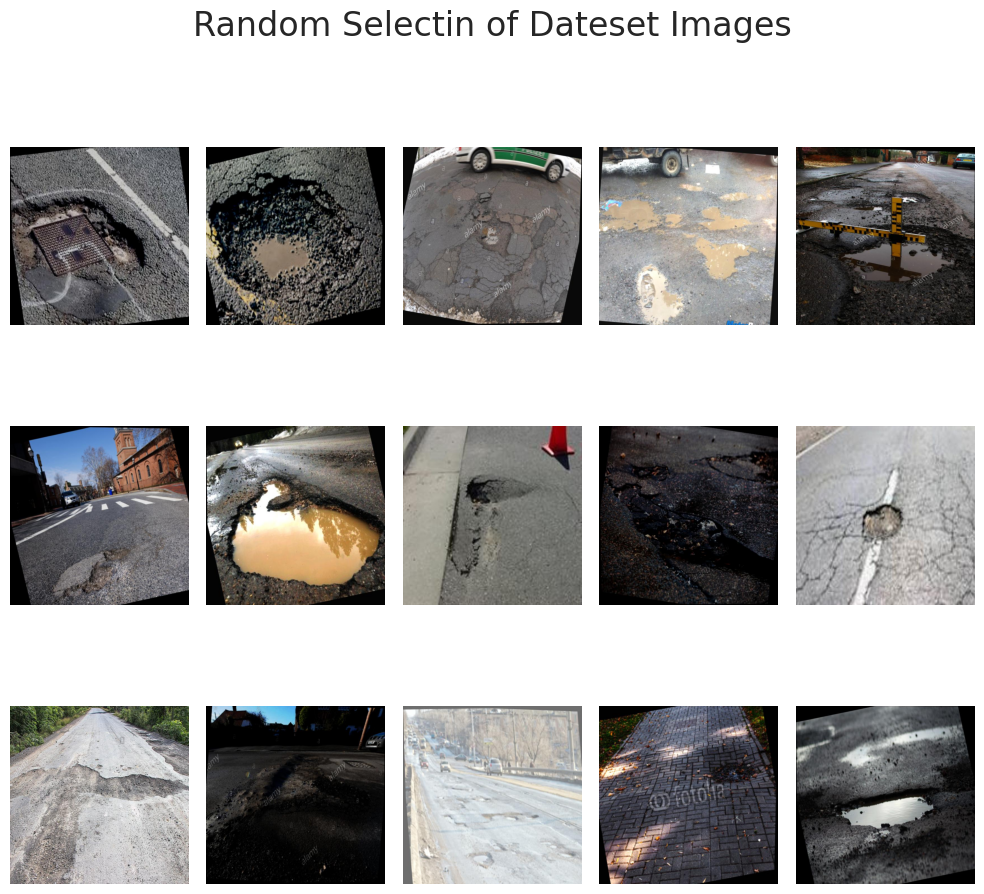

In [5]:
trainImagePath = os.path.join(dataDir,'train','images')

#List of the images
imagefiles = [f for f in os.listdir(trainImagePath) if f.endswith('.jpg')]

randomImages = random.sample(imagefiles,15)

plt.figure(figsize = (10,10))

for i, image_file in enumerate(randomImages):
  image_path = os.path.join(trainImagePath, image_file)
  image = Image.open(image_path)
  plt.subplot(3, 5 , i + 1)
  plt.imshow(image)
  plt.axis('off')

#Add a suptitle
plt.suptitle('Random Selection of Dateset Images', fontsize = 24)

#show the plot
plt.tight_layout()
plt.show()

**Model**

In [6]:
model = YOLO('yolov8n-seg.pt')

100%|██████████| 6.73M/6.73M [00:00<00:00, 83.0MB/s]


In [7]:
yamlfilepath = os.path.join(dataDir,'data.yaml')

**Training Model**

In [8]:
results = model.train(
    data = yamlfilepath,
    epochs = 30,
    imgsz = 640,
    batch = 32,
    optimizer = 'auto',
    lr0 = 0.0001,            # Initial learning rate
    lrf = 0.01,             # Final Learning rate(lr0 * lrf)
    dropout = 0.25,         # Use dropout regularization
    device = 'CPU',             # Device to run on i.e cuda device = 0
    seed =42
)

Ultralytics YOLOv8.1.18 🚀 Python-3.10.13 torch-2.1.2 CPU (Intel Xeon 2.00GHz)
engine/trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=/kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/data.yaml, epochs=30, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=CPU, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.25, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False,

100%|██████████| 755k/755k [00:00<00:00, 12.1MB/s]
2024-02-23 08:03:37,465	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-02-23 08:03:38,277	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-02-23 08:03:40.326713: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-23 08:03:40.326840: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-23 08:03:40.409742: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS facto

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'


train: Scanning /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/train/labels... 720 images, 0 backgrounds, 0 corrupt: 100%|██████████| 720/720 [00:04<00:00, 168.69it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/valid/labels... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<00:00, 162.80it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/valid is not writeable, cache not saved.


Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/segment/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/30         0G      1.467      2.994      2.458      1.422         60        640: 100%|██████████| 23/23 [05:44<00:00, 14.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:13<00:00, 13.12s/it]

                   all         60        201      0.834     0.0751       0.25      0.109      0.821     0.0686      0.244      0.107



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/30         0G       1.43      2.424      1.794      1.363         85        640: 100%|██████████| 23/23 [05:47<00:00, 15.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:13<00:00, 13.87s/it]

                   all         60        201      0.328      0.164      0.116     0.0362      0.337      0.169       0.12     0.0362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/30         0G       1.42       2.33      1.682      1.382         60        640: 100%|██████████| 23/23 [05:51<00:00, 15.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:13<00:00, 13.84s/it]

                   all         60        201      0.421      0.224      0.207     0.0974      0.531      0.209      0.224     0.0894



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/30         0G      1.427      2.324      1.576      1.368        120        640: 100%|██████████| 23/23 [06:02<00:00, 15.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:13<00:00, 13.69s/it]

                   all         60        201      0.401      0.213      0.213     0.0891      0.417      0.239      0.222     0.0869



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/30         0G      1.411      2.273       1.49      1.366         70        640: 100%|██████████| 23/23 [06:09<00:00, 16.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:14<00:00, 14.77s/it]

                   all         60        201      0.349      0.353      0.254      0.118      0.334      0.338      0.234     0.0867



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/30         0G      1.411      2.256      1.434      1.362         75        640: 100%|██████████| 23/23 [06:02<00:00, 15.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:13<00:00, 13.78s/it]

                   all         60        201      0.514      0.353      0.403      0.194      0.536      0.368      0.411      0.191



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/30         0G      1.406      2.247      1.385      1.369         71        640: 100%|██████████| 23/23 [05:59<00:00, 15.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:13<00:00, 13.37s/it]

                   all         60        201      0.427      0.313      0.271      0.127      0.458      0.284      0.262      0.114



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/30         0G      1.419      2.242      1.388      1.366         68        640: 100%|██████████| 23/23 [06:05<00:00, 15.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:13<00:00, 13.18s/it]

                   all         60        201      0.584      0.405      0.469      0.225       0.58      0.398      0.449      0.223



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/30         0G      1.376      2.233      1.353      1.338         65        640: 100%|██████████| 23/23 [06:09<00:00, 16.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:12<00:00, 12.79s/it]

                   all         60        201      0.521      0.502      0.482      0.228      0.566      0.468      0.463      0.229



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/30         0G      1.341      2.143      1.255      1.314         64        640: 100%|██████████| 23/23 [06:07<00:00, 15.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:12<00:00, 12.76s/it]

                   all         60        201      0.625      0.448      0.507      0.293      0.622      0.438      0.502      0.258



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/30         0G       1.28      2.055      1.196      1.265         67        640: 100%|██████████| 23/23 [06:05<00:00, 15.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:12<00:00, 12.82s/it]

                   all         60        201       0.59      0.612       0.61      0.338      0.592      0.612      0.604      0.314



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/30         0G      1.236      1.966      1.073      1.244         67        640: 100%|██████████| 23/23 [06:12<00:00, 16.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:12<00:00, 12.76s/it]

                   all         60        201      0.564      0.537      0.541      0.305      0.599      0.527       0.55      0.303



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/30         0G      1.235      1.968      1.088      1.247         59        640: 100%|██████████| 23/23 [06:11<00:00, 16.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:13<00:00, 13.10s/it]

                   all         60        201      0.654      0.502      0.576      0.311      0.687      0.517      0.604      0.303



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/30         0G      1.215      1.954      1.048      1.227        123        640: 100%|██████████| 23/23 [06:15<00:00, 16.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:13<00:00, 13.61s/it]

                   all         60        201      0.665      0.572       0.61       0.33      0.665      0.572       0.58      0.282



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/30         0G      1.207      1.896      1.003      1.207         74        640: 100%|██████████| 23/23 [06:21<00:00, 16.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:13<00:00, 13.01s/it]

                   all         60        201      0.617      0.617      0.601      0.354      0.626      0.602      0.589      0.314



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/30         0G      1.182      1.879     0.9933      1.206         71        640: 100%|██████████| 23/23 [06:09<00:00, 16.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:12<00:00, 12.42s/it]

                   all         60        201      0.629      0.612      0.625       0.36      0.705      0.627      0.674       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/30         0G      1.171      1.854     0.9608      1.212         90        640: 100%|██████████| 23/23 [06:06<00:00, 15.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:12<00:00, 12.43s/it]

                   all         60        201      0.613      0.667      0.648      0.342      0.616      0.667       0.66      0.337



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/30         0G      1.124      1.773     0.9193      1.162         59        640: 100%|██████████| 23/23 [06:14<00:00, 16.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:12<00:00, 12.29s/it]

                   all         60        201      0.636      0.647      0.615      0.371      0.656      0.667      0.637      0.347



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/30         0G      1.117       1.79     0.9164      1.168         55        640: 100%|██████████| 23/23 [06:04<00:00, 15.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.21s/it]

                   all         60        201      0.635      0.665       0.65      0.384       0.65      0.672      0.656      0.364


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/30         0G       1.11      1.754     0.8911       1.19         35        640: 100%|██████████| 23/23 [06:13<00:00, 16.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:13<00:00, 13.81s/it]

                   all         60        201      0.631      0.687      0.649       0.39      0.653      0.684      0.675       0.38



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/30         0G      1.093      1.715      0.834      1.171         44        640: 100%|██████████| 23/23 [06:13<00:00, 16.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:12<00:00, 12.39s/it]

                   all         60        201      0.631      0.657       0.66      0.396      0.696      0.627      0.678      0.377



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/30         0G      1.068      1.676     0.7779      1.158         59        640: 100%|██████████| 23/23 [06:04<00:00, 15.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:12<00:00, 12.90s/it]

                   all         60        201      0.643      0.657      0.658        0.4      0.659      0.672      0.665      0.373



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/30         0G      1.017      1.607     0.7309       1.13         35        640: 100%|██████████| 23/23 [06:22<00:00, 16.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:13<00:00, 13.44s/it]

                   all         60        201      0.635      0.668      0.648       0.38      0.702       0.62       0.68      0.372



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/30         0G     0.9939      1.591     0.7081      1.111         43        640: 100%|██████████| 23/23 [06:25<00:00, 16.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:12<00:00, 12.51s/it]

                   all         60        201       0.64      0.681      0.674      0.391      0.647      0.672      0.689      0.376



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/30         0G      0.975      1.554     0.6824      1.102         46        640: 100%|██████████| 23/23 [06:14<00:00, 16.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:12<00:00, 12.42s/it]

                   all         60        201      0.646      0.662      0.696      0.421       0.65      0.667      0.708      0.398



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/30         0G     0.9434      1.492     0.6548      1.076         51        640: 100%|██████████| 23/23 [06:14<00:00, 16.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:12<00:00, 12.89s/it]

                   all         60        201       0.69      0.627      0.701      0.427      0.708      0.642      0.719      0.411



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/30         0G     0.9311      1.473     0.6284      1.068         49        640: 100%|██████████| 23/23 [06:12<00:00, 16.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:13<00:00, 13.07s/it]

                   all         60        201      0.669      0.645      0.698      0.426      0.695      0.632      0.712      0.413



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/30         0G     0.9002      1.458     0.5938      1.053         29        640: 100%|██████████| 23/23 [06:15<00:00, 16.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.99s/it]

                   all         60        201      0.704      0.667      0.707      0.442      0.707      0.672      0.728      0.426



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/30         0G     0.8795      1.428     0.5983      1.034         27        640: 100%|██████████| 23/23 [06:19<00:00, 16.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:12<00:00, 12.18s/it]

                   all         60        201      0.675      0.694      0.707      0.432      0.685      0.704      0.723      0.419



30 epochs completed in 3.194 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 6.8MB
Optimizer stripped from runs/segment/train/weights/best.pt, 6.8MB

Validating runs/segment/train/weights/best.pt...
Ultralytics YOLOv8.1.18 🚀 Python-3.10.13 torch-2.1.2 CPU (Intel Xeon 2.00GHz)
YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.56s/it]


                   all         60        201      0.703      0.667      0.707      0.442      0.703      0.672      0.728      0.426
Speed: 2.6ms preprocess, 155.9ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to runs/segment/train


lr/pg0,▂▄▆████▇▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▂▁▁
lr/pg1,▂▄▆████▇▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▂▁▁
lr/pg2,▂▄▆████▇▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▂▁▁
metrics/mAP50(B),▃▁▂▂▃▄▃▅▅▆▇▇▆▆▇▇▇▇▇▇▇▇▇▇██████
metrics/mAP50(M),▂▁▂▂▂▄▃▅▅▅▇▇▆▇▆▆▇▇▇▇▇▇▇▇██████
metrics/mAP50-95(B),▂▁▂▂▂▄▃▄▄▅▆▆▆▆▆▆▇▆▇▇▇▇▇▇▇█████
metrics/mAP50-95(M),▂▁▂▂▂▄▂▄▄▅▆▆▆▆▅▆▇▆▇▇▇▇▇▇▇█████
metrics/precision(B),█▁▂▂▁▄▂▅▄▅▅▅▄▆▆▅▅▅▅▅▅▅▅▅▅▅▆▆▆▆
metrics/precision(M),█▁▄▂▁▄▃▅▄▅▅▅▅▆▆▅▆▅▆▆▆▆▆▆▅▆▆▆▆▆
metrics/recall(B),▁▂▃▃▄▄▄▅▆▅▇▇▆▆▇▇▇█████████▇███
metrics/recall(M),▁▂▃▃▄▄▃▅▆▅▇▇▆▆▇▇▇████▇█▇███▇██


**Make the inferences on images**

In [24]:
bestModelpath = '/kaggle/working/runs/segment/train/weights/best.pt'
bestModel = YOLO(bestModelpath)

**Testing the model on different Images**


image 1/1 /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/valid/images/pic-17-_jpg.rf.0d172b6accedf4c52a3868d9b690d48b.jpg: 640x640 1 Pothole, 162.5ms
Speed: 2.6ms preprocess, 162.5ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/valid/images/pic-262-_jpg.rf.02970860794f859699c9f743bc0fd7d1.jpg: 640x640 (no detections), 142.5ms
Speed: 2.0ms preprocess, 142.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/valid/images/pic-60-_jpg.rf.4e715308cc8dc7455b767414cda028ab.jpg: 640x640 2 Potholes, 161.3ms
Speed: 2.6ms preprocess, 161.3ms inference, 5.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/valid/images/pic-178-_jpg.rf.2e27d006aec1544f1eec88d9170fd6ce.jpg: 

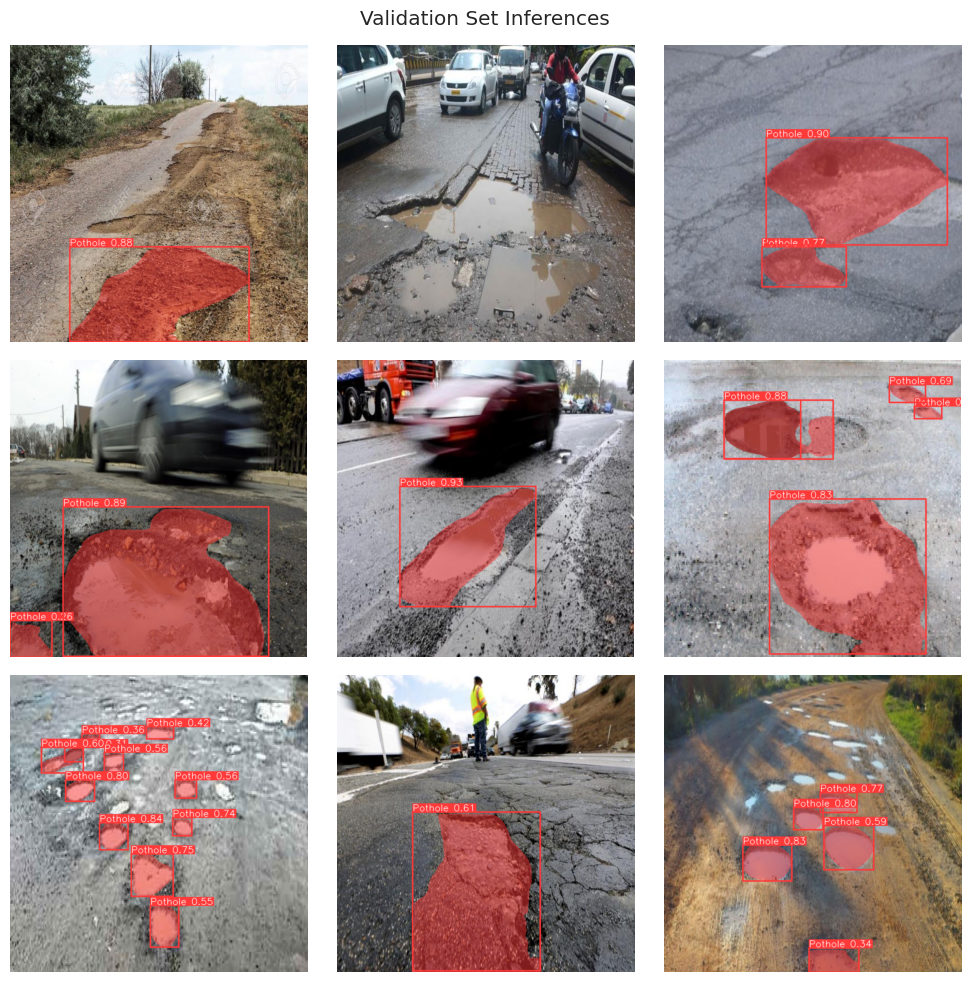

In [28]:
validImagePath = os.path.join(dataDir, 'valid', 'images')

imagefiles = [f for f in os.listdir(validImagePath) if f.endswith('.jpg')]

# Select Random Images
numImages = len(imagefiles)
selectedImage = [imagefiles[i] for i in range(0, numImages, numImages //9)]

fig, axes = plt.subplots(3, 3, figsize = (10, 10))
fig.suptitle('Validation Set Inferences')

for i, ax in enumerate(axes.flatten()):
  imagePath = os.path.join(validImagePath,selectedImage[i])
  results = bestModel.predict(source = imagePath, imgsz = 640)
  annotatedImage = results[0].plot()
  annotatedImageRGB = cv2.cvtColor(annotatedImage, cv2.COLOR_BGR2RGB)
  ax.imshow(annotatedImageRGB)
  ax.axis('off')

plt.tight_layout()
plt.show()


**Make Inferences on the Video**

In [29]:
import shutil
videoPath = '/kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/sample_video.mp4'
bestModel.predict(source = videoPath, save = True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (1/375) /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 1 Pothole, 93.9ms
video 1/1 (2/375) /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 2 Potholes, 98.7ms
video 1/1 (3/375) /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 3 Potholes, 97.3ms
video 1/1 (4/375) /kaggle/input/potho

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: ultralytics.engine.results.Masks object
 names: {0: 'Pothole'}
 obb: None
 orig_img: array([[[146, 137, 129],
         [177, 168, 160],
         [178, 169, 161],
         ...,
         [246, 243, 244],
         [246, 243, 244],
         [246, 243, 244]],
 
        [[197, 188, 180],
         [206, 197, 189],
         [164, 155, 147],
         ...,
         [246, 243, 244],
         [246, 243, 244],
         [246, 243, 244]],
 
        [[150, 141, 133],
         [183, 174, 166],
         [188, 179, 171],
         ...,
         [246, 243, 244],
         [246, 243, 244],
         [246, 243, 244]],
 
        ...,
 
        [[ 80,  92, 102],
         [ 70,  82,  92],
         [ 63,  75,  85],
         ...,
         [ 61,  81, 101],
         [ 62,  82, 102],
         [ 65,  85, 105]],
 
        [[ 70,  82,  92],
         [ 63,  75,  85],
         [ 59,  71,  8

**Converting the video format to MP4 and playing the video**

In [33]:
#Converting AVI to MP4 using FFmpeg
import subprocess
subprocess.call(['ffmpeg', '-y', '-loglevel', 'panic', '-i', '', 'Output_video.mp4'])

#Display the converted MP4 video
from IPython.display import Video
Video('/kaggle/working/Output_video.mp4', embed = True, width = 960)
